In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
df = pd.read_csv('Cancer_Data.csv')

In [6]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [7]:
df['diagnosis'] = df['diagnosis'].map({'B': 0, 'M': 1})
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [8]:
df = df.drop(['Unnamed: 32','id'], axis= 1)
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


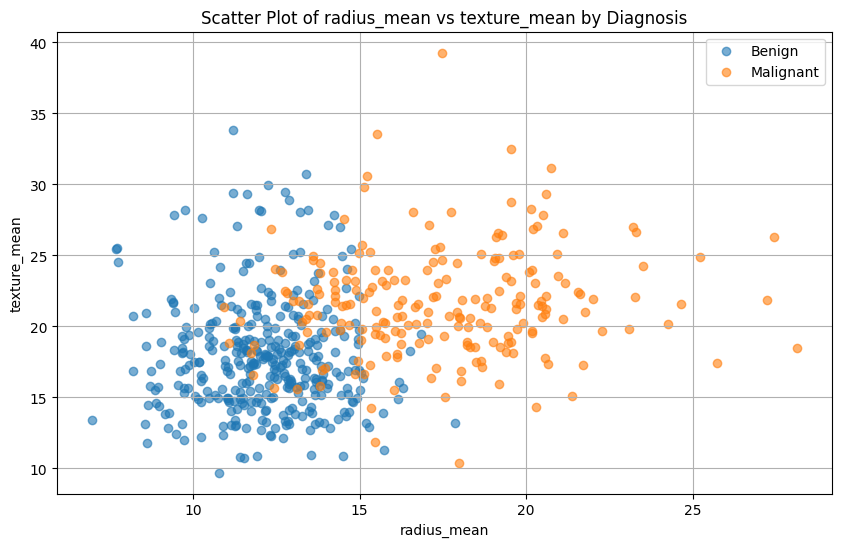

In [27]:

feature1 = 'radius_mean'
feature2 = 'texture_mean'

plt.figure(figsize=(10, 6))
plt.scatter(df[df['diagnosis'] == 0][feature1],
            df[df['diagnosis'] == 0][feature2],
            label='Benign', alpha=0.6)

plt.scatter(df[df['diagnosis'] == 1][feature1],
            df[df['diagnosis'] == 1][feature2],
            label='Malignant', alpha=0.6)

plt.title(f'Scatter Plot of {feature1} vs {feature2} by Diagnosis')
plt.xlabel(feature1)
plt.ylabel(feature2)
plt.legend()
plt.grid(True)
plt.show()


Text(470.58159722222223, 0.5, 'Y-axis')

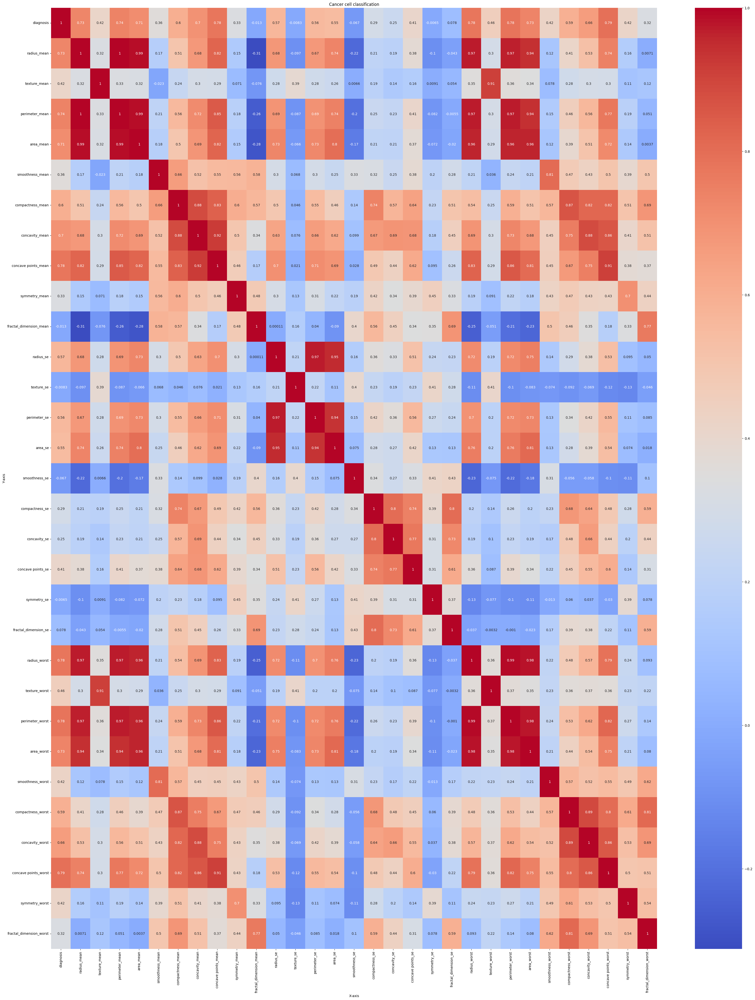

In [9]:
plt.figure(figsize=(40,50))
sns.heatmap(df.corr(),annot=True, cmap = 'coolwarm')     # corretation
plt.title('Cancer cell classification')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')

In [29]:
sns.pairplot(df)
plt.suptitle('Cancer cell classification')
plt.show()

In [12]:
from sklearn.model_selection import train_test_split

x = df.drop('diagnosis', axis=1)
y = df['diagnosis']

x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state = 42)

In [13]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [14]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors= 5)
knn.fit(x_train, y_train)
y_pred_knn = knn.predict(x_test)

              precision    recall  f1-score   support

           0       0.96      0.96      0.96        71
           1       0.93      0.93      0.93        43

    accuracy                           0.95       114
   macro avg       0.94      0.94      0.94       114
weighted avg       0.95      0.95      0.95       114



Text(50.722222222222214, 0.5, 'True Labels')

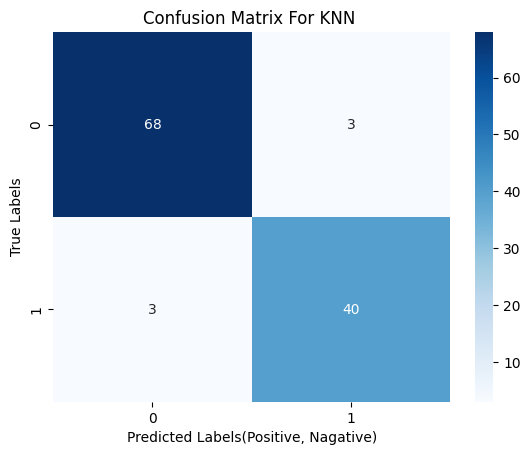

In [35]:
from sklearn.metrics import confusion_matrix, classification_report
print(classification_report(y_test, y_pred_knn))
cm = confusion_matrix(y_test, y_pred_knn)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix For KNN ')
plt.xlabel('Predicted Labels(Positive, Nagative)')
plt.ylabel('True Labels')

In [16]:
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier(max_depth= 3, random_state= 42)
dtc.fit(x_train,y_train)
y_pred_dtc = dtc.predict(x_test)

              precision    recall  f1-score   support

           0       0.95      0.97      0.96        71
           1       0.95      0.91      0.93        43

    accuracy                           0.95       114
   macro avg       0.95      0.94      0.94       114
weighted avg       0.95      0.95      0.95       114



Text(50.722222222222214, 0.5, 'True Labels')

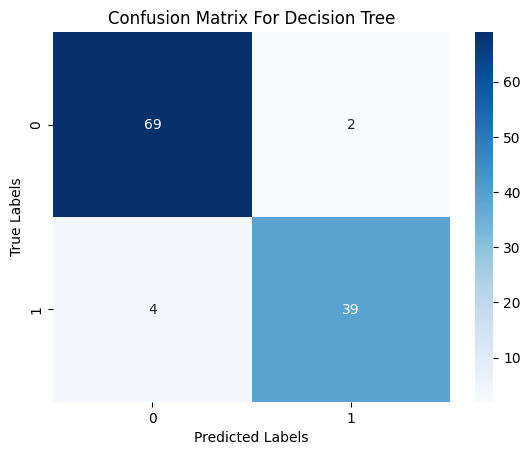

In [17]:
print(classification_report(y_test, y_pred_dtc))
cm = confusion_matrix(y_test, y_pred_dtc)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix For Decision Tree')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')

In [18]:
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB()
nb.fit(x_train, y_train)
y_pred_nb = nb.predict(x_test)

              precision    recall  f1-score   support

           0       0.96      0.99      0.97        71
           1       0.98      0.93      0.95        43

    accuracy                           0.96       114
   macro avg       0.97      0.96      0.96       114
weighted avg       0.97      0.96      0.96       114



Text(50.722222222222214, 0.5, 'True Labels')

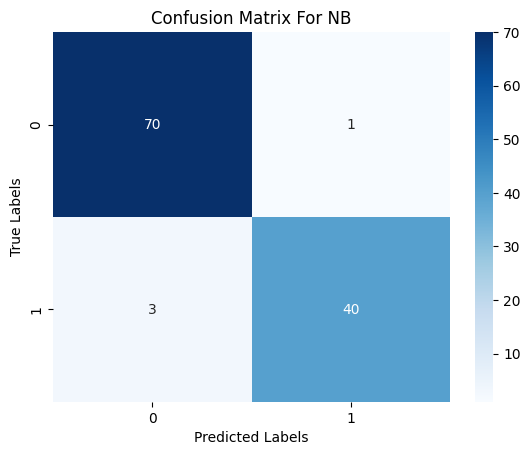

In [19]:
print(classification_report(y_test, y_pred_nb))
cm = confusion_matrix(y_test, y_pred_nb)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix For NB')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')

In [20]:
from sklearn.metrics import accuracy_score
accuracy_knn = accuracy_score(y_test, y_pred_knn)
accuracy_dtc = accuracy_score(y_test, y_pred_dtc)
accuracy_nb = accuracy_score(y_test, y_pred_nb)
print(f'Accuracy of KNN: {accuracy_knn * 100:.2f}%')
print(f'Accuracy of Decision Tree Classifier: {accuracy_dtc * 100:.2f}%')
print(f'Accuracy of Naive Bayes: {accuracy_nb * 100:.2f}%')

Accuracy of KNN: 94.74%
Accuracy of Decision Tree Classifier: 94.74%
Accuracy of Naive Bayes: 96.49%


In [24]:

num_samples = 5
random_samples = []

feature_means = x.mean()
feature_stds = x.std()

for _ in range(num_samples):
  random_data = np.random.normal(feature_means, feature_stds, size=x.shape[1])
  random_samples.append(random_data)

random_samples_df = pd.DataFrame(random_samples, columns=x.columns)

random_samples_scaled = scaler.transform(random_samples_df)
print(random_samples_scaled)


# model pridection
predictions_knn = knn.predict(random_samples_scaled)
predictions_dtc = dtc.predict(random_samples_scaled)
predictions_nb = nb.predict(random_samples_scaled)


prediction_labels_knn = ['Malignant' if p == 1 else 'Benign' for p in predictions_knn]
prediction_labels_dtc = ['Malignant' if p == 1 else 'Benign' for p in predictions_dtc]
prediction_labels_nb = ['Malignant' if p == 1 else 'Benign' for p in predictions_nb]

print("\nPredictions for 5 random samples:")
print("---------------------------------")
for i in range(num_samples):
  print(f"Sample {i+1}:")
  print(f"  KNN Prediction: {prediction_labels_knn[i]}")
  print(f"  Decision Tree Prediction: {prediction_labels_dtc[i]}")
  print(f"  Naive Bayes Prediction: {prediction_labels_nb[i]}")
  print("-" * 20)


[[ 0.70013251  1.03460503  0.56696709 -0.74958961 -0.79207826 -0.35287648
   0.32038778  0.18513086  0.88749372  0.34675851 -0.6956798  -0.76625075
  -0.29766945 -0.52379968 -1.14169424  0.37518442 -1.96485217  0.17018411
   0.9133003   0.60885208 -0.23540229  0.08806336  0.19856544  0.45860492
   0.08029072  0.45617142 -0.53093869 -0.69810753  1.77575233 -1.08195697]
 [ 0.41235488 -0.04878107  0.56442889 -0.26980165  1.07849811 -0.16821869
  -1.83429858  0.48123721 -1.82316608  0.18270338  1.90625824  0.11859597
  -1.06132586  1.10187661 -1.93590469  1.08342429 -0.09596613  0.80236993
  -0.32648594 -0.49122499 -1.72911323  1.97748023 -0.11445458 -0.25019411
  -0.58755706 -2.05193207  1.82359093  2.31700276 -0.11640516 -0.87488914]
 [ 0.69053502  0.52069342  1.92610983  0.28663541  0.03756715 -0.56391233
  -0.73062934  1.10141717  1.2055454   1.00320093  1.64729639 -1.32049834
   1.05034915  1.36258763 -0.86057137  0.49385916  1.0521449   1.42474785
   1.14663397 -0.71569493 -0.7218222

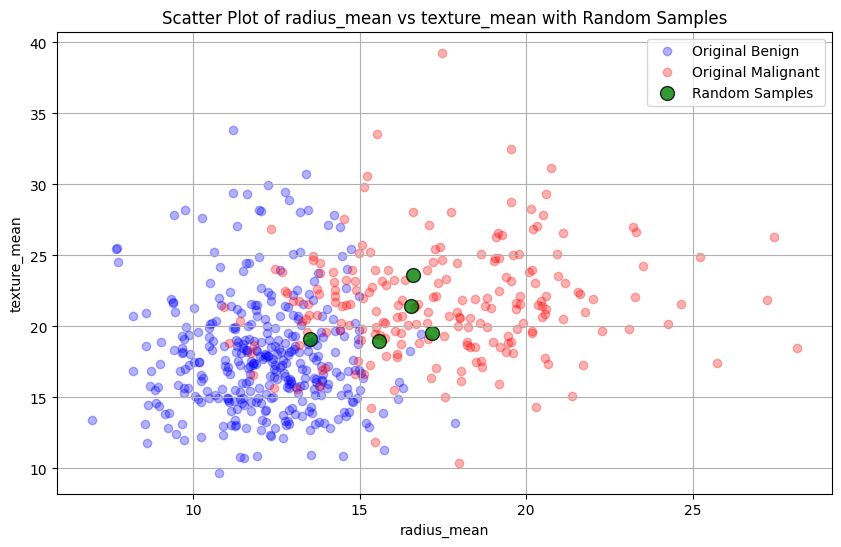

In [28]:
# prompt: scatter plot the point thet you are genrated before ramdomly

# Assuming you want to plot the randomly generated samples against two features
# Let's use 'radius_mean' and 'texture_mean' for consistency with the previous scatter plot

feature1 = 'radius_mean'
feature2 = 'texture_mean'

plt.figure(figsize=(10, 6))

# Plot the original data points for comparison
plt.scatter(df[df['diagnosis'] == 0][feature1],
            df[df['diagnosis'] == 0][feature2],
            label='Original Benign', alpha=0.3, color='blue')

plt.scatter(df[df['diagnosis'] == 1][feature1],
            df[df['diagnosis'] == 1][feature2],
            label='Original Malignant', alpha=0.3, color='red')

# Plot the randomly generated samples
# We need to get the unscaled values for plotting
# Since random_samples_df contains the unscaled values, we can use that directly
plt.scatter(random_samples_df[feature1],
            random_samples_df[feature2],
            label='Random Samples', alpha=0.8, color='green', s=100, edgecolors='black') # s is marker size

plt.title(f'Scatter Plot of {feature1} vs {feature2} with Random Samples')
plt.xlabel(feature1)
plt.ylabel(feature2)
plt.legend()
plt.grid(True)
plt.show()


Gradient Boosting Classifier Results:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95        71
           1       0.93      0.91      0.92        43

    accuracy                           0.94       114
   macro avg       0.94      0.93      0.93       114
weighted avg       0.94      0.94      0.94       114



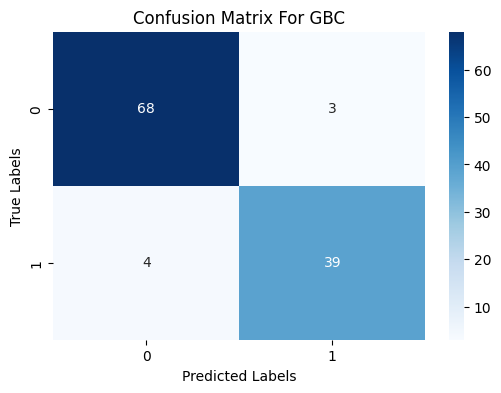

Accuracy of Gradient Boosting Classifier: 93.86%

Predictions for 5 random samples with GBC:
---------------------------------
Sample 1:
  GBC Prediction: Benign
--------------------
Sample 2:
  GBC Prediction: Malignant
--------------------
Sample 3:
  GBC Prediction: Malignant
--------------------
Sample 4:
  GBC Prediction: Benign
--------------------
Sample 5:
  GBC Prediction: Malignant
--------------------


In [31]:

from sklearn.ensemble import GradientBoostingClassifier

gbc = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=8, random_state=42)
gbc.fit(x_train, y_train)

# Make predictions on the test set
y_pred_gbc = gbc.predict(x_test)

# Evaluate the GBC model
print("\nGradient Boosting Classifier Results:")
print(classification_report(y_test, y_pred_gbc))

# Plot the confusion matrix for GBC
cm_gbc = confusion_matrix(y_test, y_pred_gbc)
plt.figure(figsize=(6, 4))
sns.heatmap(cm_gbc, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix For GBC')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Calculate and print the accuracy for GBC
accuracy_gbc = accuracy_score(y_test, y_pred_gbc)
print(f'Accuracy of Gradient Boosting Classifier: {accuracy_gbc * 100:.2f}%')

# Make predictions on the random samples using GBC
predictions_gbc = gbc.predict(random_samples_scaled)
prediction_labels_gbc = ['Malignant' if p == 1 else 'Benign' for p in predictions_gbc]

print("\nPredictions for 5 random samples with GBC:")
print("---------------------------------")
for i in range(num_samples):
  print(f"Sample {i+1}:")
  print(f"  GBC Prediction: {prediction_labels_gbc[i]}")
  print("-" * 20)


Random Forest Classifier Results:
              precision    recall  f1-score   support

           0       0.96      0.99      0.97        71
           1       0.98      0.93      0.95        43

    accuracy                           0.96       114
   macro avg       0.97      0.96      0.96       114
weighted avg       0.97      0.96      0.96       114



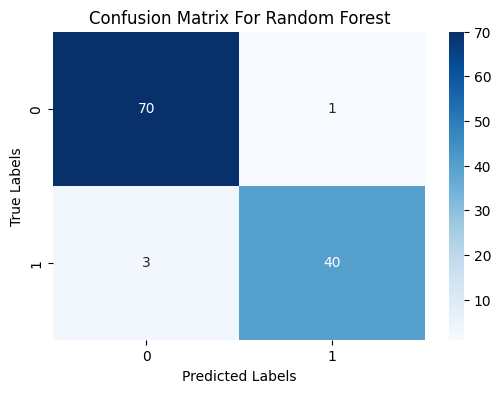

Accuracy of Random Forest Classifier: 96.49%

Predictions for 5 random samples with Random Forest:
---------------------------------
Sample 1:
  Random Forest Prediction: Benign
--------------------
Sample 2:
  Random Forest Prediction: Malignant
--------------------
Sample 3:
  Random Forest Prediction: Malignant
--------------------
Sample 4:
  Random Forest Prediction: Benign
--------------------
Sample 5:
  Random Forest Prediction: Malignant
--------------------


In [32]:
# prompt: apply thie Random Forest

from sklearn.ensemble import RandomForestClassifier

# Initialize and train the Random Forest Classifier
rfc = RandomForestClassifier(n_estimators=100, random_state=42)
rfc.fit(x_train, y_train)

# Make predictions on the test set
y_pred_rfc = rfc.predict(x_test)

# Evaluate the RFC model
print("\nRandom Forest Classifier Results:")
print(classification_report(y_test, y_pred_rfc))

# Plot the confusion matrix for RFC
cm_rfc = confusion_matrix(y_test, y_pred_rfc)
plt.figure(figsize=(6, 4))
sns.heatmap(cm_rfc, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix For Random Forest')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Calculate and print the accuracy for RFC
accuracy_rfc = accuracy_score(y_test, y_pred_rfc)
print(f'Accuracy of Random Forest Classifier: {accuracy_rfc * 100:.2f}%')

# Make predictions on the random samples using RFC
predictions_rfc = rfc.predict(random_samples_scaled)
prediction_labels_rfc = ['Malignant' if p == 1 else 'Benign' for p in predictions_rfc]

print("\nPredictions for 5 random samples with Random Forest:")
print("---------------------------------")
for i in range(num_samples):
  print(f"Sample {i+1}:")
  print(f"  Random Forest Prediction: {prediction_labels_rfc[i]}")
  print("-" * 20)